In [1]:
import json
from datetime import datetime , timezone
import time
import numpy as np
import codecs
import struct
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import pycorrelate
import collections
import itertools
from mpl_toolkits import mplot3d

pd.set_option('display.max_rows', 1000)
%matplotlib inline

### 1. Pick a session to work with!

In [2]:
metadata = pickle.load(open('./cleaned_data/metadata.p', 'rb'))
print('Please Choose a Session to Work With:')
for k in metadata: print(k, end=',  ')

Please Choose a Session to Work With:
david_2,  patrick_1,  patrick_2,  beata_1,  david_3a,  david_3b,  irmandy_1,  juliana_1,  

In [3]:
SESSION = 'beata_1'

let's print some basic summary statistics based on the metadata for this session:

In [4]:
s_meta = metadata[SESSION]

try:
    print(SESSION, 'on', s_meta['date'])
    print('-'*10)
    print(s_meta['glasses_sessions_total_duration_string'], 'hr of glassess data starting at', \
          s_meta['glasses_session_times'][0][0])
    print('%02d:%02d hr of    video data starting at ' % (s_meta['vid_duration_sec'] / 60 // 60, 
           s_meta['vid_duration_sec'] / 60 % 60 )  + s_meta['vid_start'])
    print('-'*10)
    print('glasses sessions:')
    for i in range(len(s_meta['glasses_session_times'])):
        print('session ' + str(i) + ':',s_meta['glasses_session_times'][i][0],'to',\
              s_meta['glasses_session_times'][i][1],'\tduration:%8.2f min' % s_meta['glasses_session_durations_min'][i])
except:
    print('failed to load video analysis file.')

beata_1 on 04/02
----------
08:47 hr of glassess data starting at 04/02/21 12:13:25PM EDT
08:07 hr of    video data starting at 04/02/21 12:16:30PM EDT
----------
glasses sessions:
session 0: 04/02/21 12:13:25PM EDT to 04/02/21 04:39:00PM EDT 	duration:  265.59 min
session 1: 04/02/21 04:54:44PM EDT to 04/02/21 09:16:13PM EDT 	duration:  261.48 min


### Load the Data
...and let's load in the data, and plot what we have just to take a look, by session

In [5]:
#load video data (eyeratio and openface features), 60 Hz (16 ms between samples)
df_vid = pd.read_csv('./cleaned_data/' + SESSION + '/video_consolidated.csv', index_col=0)

#load glasses blink data, 1kHz (1 ms between samples)
blink_sess = pickle.load(open('./cleaned_data/' + SESSION + '/sessions_blink.p', 'rb'))

#load glasses accel data, 10 Hz (100 ms between samples)
accel_sess = pickle.load(open('./cleaned_data/' + SESSION + '/sessions_accel.p', 'rb'))

# give some stupid FutureWarning error thanks to pandas and numpy not being in sync.
# https://stackoverflow.com/questions/48818335/why-pandas-read-csv-issues-this-warning-elementwise-comparison-failed

/usr/local/lib/python3.9/site-packages/numpy/lib/arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [7]:
##BECAUSE IT'S BEATA WE ONLY WANT THE FIRST 4hrs and 20min
#lets just remove the second glasses session
blink_sess = [blink_sess[0]]
accel_sess = [accel_sess[0]]

In [8]:
df_vid.head()

,AU45_r,AU45_c,pose_Rx,pose_Ry,pose_Rz,pose_Tx,pose_Ty,pose_Tz,success,confidence,tick_ms,est_timestamp_ms
0,2.10,1.0,0.390,0.236,-0.089,44.4,-72.7,704.5,1,0.98,0,1617380190000
1,2.17,1.0,0.385,0.267,-0.066,42.1,-72.5,700.6,1,0.98,17,1617380190017
2,2.29,1.0,0.392,0.258,-0.054,41.8,-72.7,700.8,1,0.98,33,1617380190033
3,2.22,1.0,0.411,0.243,-0.046,41.5,-72.5,696.5,1,0.98,50,1617380190050
4,2.21,1.0,0.423,0.254,-0.042,41.1,-72.9,699.2,1,0.98,67,1617380190067


In [9]:
df_vid['success'].value_counts()

1    1060310
0     694459
Name: success, dtype: int64

In [10]:
blink_sess[0].head()

,timestamp_ms,value
0,1617380005517,253
1,1617380005518,253
2,1617380005519,253
3,1617380005520,127
4,1617380005521,119


In [11]:
accel_sess[0].head()

,timestamp_ms,quatI,quatJ,quatK,quatReal,quatRadianAccuracy
0,1617380005945,-0.254028,-0.596313,-0.131531,0.750061,3.141602
1,1617380006033,-0.245728,-0.598633,-0.139587,0.749512,3.141602
2,1617380006134,-0.245544,-0.599182,-0.137939,0.749451,3.141602
3,1617380006233,-0.250916,-0.602417,-0.167480,0.739014,3.141602
4,1617380006333,-0.295410,-0.618469,-0.312378,0.657776,3.141602


#### Let's plot it to make sure it looks normal

In [12]:
#time_col is 'timestamp_ms' in glasses, 'est_timestamp_ms' for estimate in video until x-corr-ed and time aligned
def df_between_timestamps(df, time_col, start_time, end_time):
    return df[(start_time <= df[time_col]) & (df[time_col] <= end_time)].copy()

def plot_session(df_sess, df_vid, plot_type='blink', vid_timestamp='est_timestamp_ms'):
    df_vid = df_between_timestamps(df_vid, vid_timestamp, 
                                   df_sess['timestamp_ms'].iloc[0], 
                                   df_sess['timestamp_ms'].iloc[-1])
    if plot_type == 'blink':
        fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(12,4))
        
        ax[0].plot(df_sess['timestamp_ms'], df_sess['value'])
        ax[0].set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Blink Data')
        ax[0].grid()

        ax[1].plot(df_vid[vid_timestamp], df_vid['eye_ratio'])
        ax[1].set(xlabel='timestamp (ms)', ylabel='ratio', title='Eye Ratio')
        ax[1].grid()
        
        ax[2].plot(df_vid[vid_timestamp], df_vid['AU45_c']*5, label='AU45_c')
        ax[2].plot(df_vid[vid_timestamp], df_vid['AU45_r'], label='AU45_r')
        ax[2].set(xlabel='timestamp (ms)', ylabel='blink feature', title='Openface Code')
        ax[2].grid()
        fig.tight_layout()
        plt.show()
    
    if plot_type == 'accel':
        fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(12,4))
        
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatI'], label='I')
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatJ'], label='J')
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatK'], label='K')
        ax[0].set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Quat Data')
        ax[0].grid()

        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Rx'], label='X')
        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Ry'], label='Y')
        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Rz'], label='Z')
        ax[1].set(xlabel='timestamp (ms)', ylabel='rad', title='Video Rotation Data')
        ax[1].grid()
        
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Tx'], label='X')
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Ty'], label='Y')
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Tz'], label='Z')
        ax[2].set(xlabel='timestamp (ms)', ylabel='mm', title='Video Translation Data')
        ax[2].grid()
        fig.tight_layout()
        plt.show()
        
    if plot_type == 'confidence':
        fig, ax = plt.subplots(figsize=(12,4))
        
        ax.plot(df_vid[vid_timestamp], df_vid['success'], label='X')
        ax.plot(df_vid[vid_timestamp], df_vid['confidence'], label='Y')
        ax.set(xlabel='timestamp (ms)', ylabel='confidence/success', title='Confidence/Success of Video Tracking')
        ax.grid()
        fig.tight_layout()
        plt.show()


BLINK SESSION 0


KeyError: 'eye_ratio'

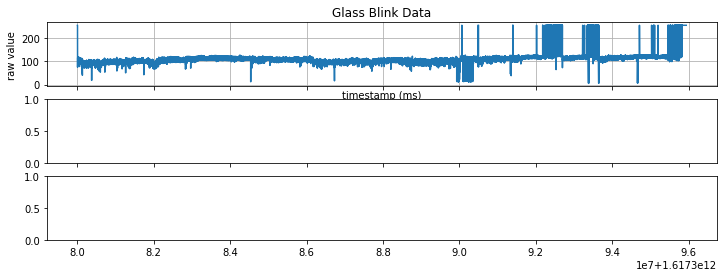

In [13]:
for sess_num in range(len(blink_sess)):
    print('BLINK SESSION', sess_num)
    plot_session(blink_sess[sess_num], df_vid, plot_type='blink')

ACCEL SESSION 0


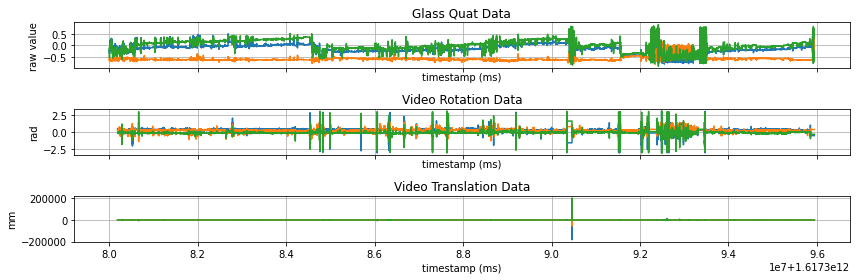

In [14]:
for sess_num in range(len(accel_sess)):
    print('ACCEL SESSION', sess_num)
    plot_session(accel_sess[sess_num], df_vid, plot_type='accel')

CONFIDENCE SESSION 0


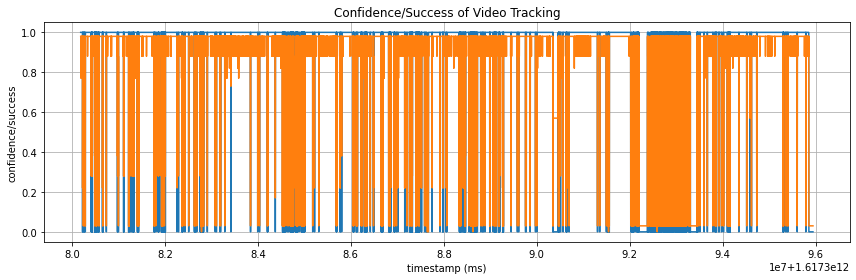

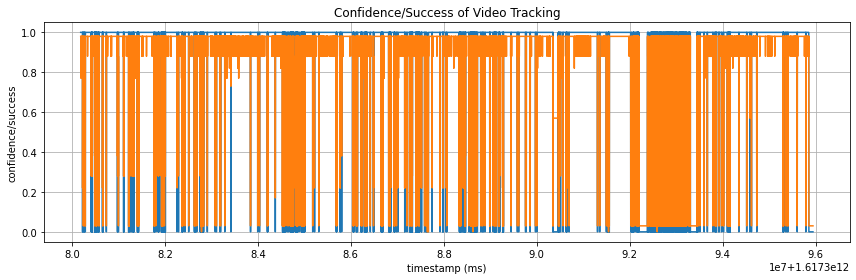

In [15]:
for sess_num in range(len(accel_sess)):
    print('CONFIDENCE SESSION', sess_num)
    plot_session(accel_sess[sess_num], df_vid, plot_type='confidence')
    
plot_session(accel_sess[0], df_vid, plot_type='confidence')
    


# NOTE!!

in this file, the time alignment is done by:

(1) applying the blink strategy (LPF, 1st derivative, LPF, threshold, blink duration applied) and getting a true blink value from 0 to 1.  Scaling that value to -1 to 1.

(2) taking the video blink continous guess, removing frames where the tracking was unsuccessful, scaling it between -1 and 1, and filling NaNs (where tracking was unsuccessful) with 0s.  This way we have definite positives at 1 and approaching 1, definite negatives at -1, and unknowns at 0.

Definite negatives in both signals are -1*-1 = 1; definite positives are 1\*1=1. Unkowns give 0, and the less certain the video is the less weight is put on that frame.  This should give us what we need.

This is not the technique we started with, where we tried to align the continous signals of the video blink classifier and the blink reflectance data.  These signals really don't have a common sense mapping to one another, *and* the video is a lot more sparse in it's useful data than I initially realized.  There aren't easy ways to find signals that map 1-to-1 to each other from the video and glasses streams, so this seems to be the best choice.

## Better Time Alignment

We need to compare signals from the video feed (60Hz) and our Blink Data (1kHz) and Accelerometer data (10Hz).

We're also not totally guaranteed that the times are aligned perfectly, which we've stored our estimate of max error (in seconds) in `s_meta['start_error_sec']`.  To do a good comparison we need to transform the data into comparable timesteps/units and cross correlate them to find a minimum error in signal via time.

---

We'll start by selecting a small range where we have good continuous blink data from openface (AU45_c) and blink data from the glasses.  

We'll upsample our data to 3kHz with zeros in between (the lowest common multiple of our sample rates), and run our cross correlation over this match.  Based on this, we can move our 60Hz signal to the nearest correct 1/3 ms.  This alignment should hold for the whole video, no matter what processing we're doing.

---

when running the below for the first time, pick a blink session above that has good data, and play with the offset/duration so that we capture a section that has good video data.  We can use `check_xcorr_selection` below to dial in the choice of section that will be run through the xcorr.  Once we've done this and run the `apply_xcorr_timecorrect` function, it will save the offset in a pickle that will always be used for that participant.

In [16]:
def string_to_timestamp_ms(datestring):
    return datetime.strptime(datestring, '%m/%d/%y %I:%M:%S%p %Z').timestamp()*1000

def timestamp_ms_to_string(timestamp):
    local_tz = datetime.now().astimezone().tzinfo
    return datetime.fromtimestamp(timestamp/1000, tz=local_tz).strftime('%m/%d/%y %I:%M:%S%p %Z')

def check_xcorr_selection(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5):
    print('passed session extends from', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[0]), 
                                   'to', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[-1]))
    
    print(' video session extends from', s_meta['vid_start'], 'to',
          timestamp_ms_to_string(string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000))
    
    print('-'*20)
    
    shared_starttimestamp_ms = max(blink_session['timestamp_ms'].iloc[0], string_to_timestamp_ms(s_meta['vid_start']))
    shared_endtimestamp_ms = min(blink_session['timestamp_ms'].iloc[-1], string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000)
    shared_duration_ms = shared_endtimestamp_ms - shared_starttimestamp_ms
    
    print('together we extend from ', timestamp_ms_to_string(shared_starttimestamp_ms), 
                                  'to', timestamp_ms_to_string(shared_endtimestamp_ms))
    print('shared duration = %.1f min' % (shared_duration_ms / 60000))
    
    print('-'*20)
    
    assert (shared_duration_ms / 1000) > offset_sec + xcorr_dur_sec + 2*max_err_sec, 'not enough overlap to test!'
    
    start_timestamp_glasses = shared_starttimestamp_ms + (offset_sec*1000) + (max_err_sec*1000)
    end_timestamp_glasses = start_timestamp_glasses + (xcorr_dur_sec*1000) 
    
    start_timestamp_vid = start_timestamp_glasses - (max_err_sec*1000) 
    end_timestamp_vid = end_timestamp_glasses + (max_err_sec*1000)
    
    df_b = df_between_timestamps(blink_session, 'timestamp_ms', start_timestamp_glasses, end_timestamp_glasses)
    df_v = df_between_timestamps(df_vid, 'est_timestamp_ms', start_timestamp_vid, end_timestamp_vid)
    
    print('using glasses data from', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[0]), 
                               'to', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_b['timestamp_ms'].iloc[-1]-df_b['timestamp_ms'].iloc[0])/60000),'min)')
    
    print('using   video data from', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[0]),
                               'to', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_v['est_timestamp_ms'].iloc[-1]-df_v['est_timestamp_ms'].iloc[0])/60000),'min)')
    
    print('-'*20)
    print('we will sweep the AU45 video signal over the glasses data:')
    
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(df_v['est_timestamp_ms'], df_v['AU45_r']/max(df_v['AU45_r']))
    ax.plot(df_b['timestamp_ms'], (df_b['value']-min(df_b['value']))/(max(df_b['value'])-min(df_b['value'])))
    plt.show()
    
    
def xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5):
    
    print('passed session extends from', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[0]), 
                                   'to', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[-1]))
    
    print(' video session extends from', s_meta['vid_start'], 'to',
          timestamp_ms_to_string(string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000))
    
    print('-'*20)
    
    shared_starttimestamp_ms = max(blink_session['timestamp_ms'].iloc[0], string_to_timestamp_ms(s_meta['vid_start']))
    shared_endtimestamp_ms = min(blink_session['timestamp_ms'].iloc[-1], string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000)
    shared_duration_ms = shared_endtimestamp_ms - shared_starttimestamp_ms
    
    print('together we extend from ', timestamp_ms_to_string(shared_starttimestamp_ms), 
                                  'to', timestamp_ms_to_string(shared_endtimestamp_ms))
    print('shared duration = %.1f min' % (shared_duration_ms / 60000))
    
    print('-'*20)
    
    assert (shared_duration_ms / 1000) > offset_sec + xcorr_dur_sec + 2*max_err_sec, 'not enough overlap to test!'
    
    start_timestamp_glasses = shared_starttimestamp_ms + (offset_sec*1000) + (max_err_sec*1000)
    end_timestamp_glasses = start_timestamp_glasses + (xcorr_dur_sec*1000) 
    
    start_timestamp_vid = start_timestamp_glasses - (max_err_sec*1000) 
    end_timestamp_vid = end_timestamp_glasses + (max_err_sec*1000)
    
    df_b = df_between_timestamps(blink_session, 'timestamp_ms', start_timestamp_glasses, end_timestamp_glasses)
    df_v = df_between_timestamps(df_vid, 'est_timestamp_ms', start_timestamp_vid, end_timestamp_vid)
    
    print('using glasses data from', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[0]), 
                               'to', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_b['timestamp_ms'].iloc[-1]-df_b['timestamp_ms'].iloc[0])/60000),'min)')
    
    print('using   video data from', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[0]),
                               'to', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_v['est_timestamp_ms'].iloc[-1]-df_v['est_timestamp_ms'].iloc[0])/60000),'min)')
    
    print('-'*20)
    print('we will sweep the AU45 video signal over the glasses data:')
    
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(df_v['est_timestamp_ms'], df_v['AU45_r']/max(df_v['AU45_r']))
    ax.plot(df_b['timestamp_ms'], (df_b['value']-min(df_b['value']))/(max(df_b['value'])-min(df_b['value'])))
    plt.show()
    
    #normalize and UPSAMPLE! upsample blink data by 3x and openface data by 50x
    #we invert the blink data because we normally expect a lower signal on blinks
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    #plt.plot(df_b['timestamp_ms'], (df_b['value'] - min(df_b['value']))/(max(df_b['value'])- min(df_b['value'])))
    #plt.title('check LPF')
    #plt.show()
    
    #step 1: LPF input, take derivative, LPF derivative
    smooth_input = moving_average(df_b['value'], 50)
    dx = np.append([np.nan], np.diff(smooth_input))
    smooth_dx = moving_average(dx, 25)
    decision = (smooth_dx < -0.06)
    
    blink = []
    samples_per_blink = int((175 / 1000) * 1000) ## 175 ms / 1000ms/s * fps
    i=0
    while i<len(decision):
        if decision[i]:
            blink.extend([1]*samples_per_blink)
            i += samples_per_blink
        else: 
            blink.append(0)
            i += 1
    if len(blink)>len(decision): blink = blink[:len(decision)]
    
    df_b['value'] = np.array(blink)*2 - 1
    
    #plt.plot(df_b['timestamp_ms'], df_b['value'])
    #plt.xlim(min(df_b['timestamp_ms']), max(df_b['timestamp_ms']))
    #plt.ylim(df_b['value'].min(), df_b['value'].max())
    #plt.title('check LPF')
    #plt.show()
    
    #upsample
    blink_up = np.zeros(len(df_b)*3)
    blink_up[::3] = df_b['value']
    blink_t0 = df_b['timestamp_ms'].iloc[0]
    
    #replace 0s with nans if success is not there
    #plt.plot(df_v['est_timestamp_ms'], df_v['AU45_r'])
    #plt.title('check nans')
    #plt.show()
    
    df_v.loc[df_v['success'] == 0, 'AU45_r'] = np.nan
    df_v['AU45_r'] = df_v['AU45_r'].apply(lambda x: 2*x - 1)
    df_v['AU45_r'] = df_v['AU45_r'].fillna(0)
    
    #plt.plot(df_v['est_timestamp_ms'], df_v['AU45_r'])
    #plt.title('check nans')
    #plt.show()
    
    vid_up = np.zeros(len(df_v)*50)
    vid_up[::50] = df_v['AU45_r']/max(df_v['AU45_r'])
    vid_t0 = df_v['est_timestamp_ms'].iloc[0]
    
    #now we'll xcorr these two numpy arrays; blink_up slides across vid_up where there it
    #can totally be overlapped.  A lag of 0 assumes blink_t0=vid_t0.  We expect a length
    #here of len(video)-len(blinkarray) as we slide, so err_sec*3k points.  Heavy computation.
    #pycorrelate is used because it is designed to only compute xcorr where overlap is >= minsize(x,y)-1
    xcorr = pycorrelate.ucorrelate(blink_up, vid_up, maxlag=len(vid_up)-len(blink_up))
    
    print('vidlen=',len(vid_up),'blinklen=',len(blink_up),'xcorrlen=',len(xcorr))
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(xcorr)
    plt.title('xcorr at 3kHz')
    plt.show()
    
    #pull out the index (and ms delay) of the blink signal to get a perfect match
    index_max_xcorr = np.argmax(np.abs(xcorr))
    index_ms = index_max_xcorr / 3.
    
    #difference to add to gopro timestamps to make them time-aligned
    difference = index_ms - (blink_t0 - vid_t0) 
    
    print('blink aligns with offset',index_max_xcorr,'or',index_ms,'ms.',
          'We originally had a difference between start times of', (blink_t0-vid_t0),
          '.That\'s', difference, 'ms to add to video files')
    
    return difference
    

def apply_xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5, overwrite=False):
    #if overwrite=False, try to load xcorr ms offset from pickle.  If that fails or overwrite=True, generate a new
    #one and save it to disk.  In either case, we apply the xcorr offset to the video df 'est_timestamp_ms' column
    #to get a corrected 'timestamp_ms' column and return a new df_vid with corrected timestamps.
    #offset_sec is how many seconds from the start of the video we start our xcorr, and size of xcorr is xcorr_dur_sec
    
    if not overwrite:
        try:
            difference = pickle.load(open('./cleaned_data/' + SESSION + '/xcorr_offset_ms.p', 'rb'))
            print('loaded existing xcorr_offset, applying difference of', difference, 'ms to our video dataframe.')
            df_vid['timestamp_ms'] = df_vid['est_timestamp_ms'].apply(lambda v: int(v + difference))
            return df_vid
        except:
            print('Failed to find existing xcorr on disk!')
    
    print('Generating new xcorr...')
    difference = xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec, xcorr_dur_sec)
    print('saving to file ./cleaned_data/' + SESSION + '/xcorr_offset_ms.p')
    pickle.dump(difference, open( './cleaned_data/' + SESSION + '/xcorr_offset_ms.p', "wb" ))
    
    df_vid['timestamp_ms'] = df_vid['est_timestamp_ms'].apply(lambda v: int(v + difference))
    return df_vid
    
        
def plot_blinkcompare(df_sess, df_vid, vid_timestamp='est_timestamp_ms', secs=None, last=False):
    #print 'secs' of data from beginning (last=True) or end (last=True) of session
    
    shared_starttimestamp_ms = max(df_sess['timestamp_ms'].iloc[0], df_vid[vid_timestamp].iloc[0])
    shared_endtimestamp_ms = min(df_sess['timestamp_ms'].iloc[-1], df_vid[vid_timestamp].iloc[-1])
        
    if secs is not None:
        if last:
            shared_starttimestamp_ms = max(shared_starttimestamp_ms, shared_endtimestamp_ms - secs*1000)
        else:
            shared_endtimestamp_ms = min(shared_endtimestamp_ms, shared_starttimestamp_ms + secs*1000)
    
    df_sess = df_between_timestamps(df_sess, 'timestamp_ms', shared_starttimestamp_ms, shared_endtimestamp_ms)
    df_vid = df_between_timestamps(df_vid, vid_timestamp, shared_starttimestamp_ms, shared_endtimestamp_ms) 

    fig, ax = plt.subplots(figsize=(16,4))

    ax.plot(df_vid[vid_timestamp], df_vid['AU45_c']/max(df_vid['AU45_c']))
    ax.plot(df_vid[vid_timestamp], df_vid['AU45_r']/max(df_vid['AU45_r']))
    ax.plot(df_sess['timestamp_ms'], df_sess['value']/max(df_sess['value']))
    ax.set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Blink Data')
    ax.grid()
    
    fig.tight_layout()
    plt.show()                                         

what we should actually correlate (1) takes into account zeros in video (np.nan?) don't want to normalize by length that inclues those if we just haven't tracked well.  Turns out the data is really full of holes.  Hopefully we don't need to do this by hand and just replacing them with nans will do it, need to check the documentation. and (2) we should really use the inverted 1st derivative after LPF for the blink data, which is the signal that most accurately corresponds to the raw blink signal.

Use this function to find a good session and offset that has reasonable data to xcorr, and then pass these parameters to the xcorr function in the next cell.

Before Time Align


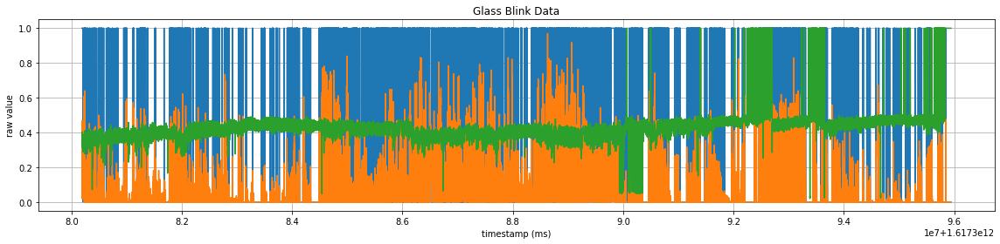

After Time Align


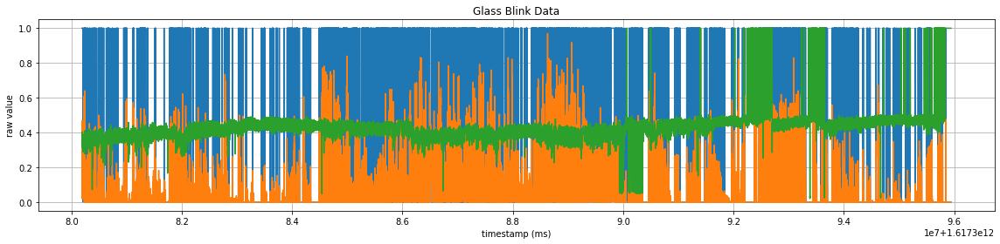

In [18]:
#not going to xcorr, just align with pulses.  We'll just copy the timestamp_ms to est_timestamp_ms
new_df_vid = df_vid.copy()
new_df_vid['timestamp_ms'] = df_vid['est_timestamp_ms']
    
print('Before Time Align')
plot_blinkcompare(blink_sess[0], new_df_vid, 'est_timestamp_ms')
print('After Time Align')
plot_blinkcompare(blink_sess[0], new_df_vid, 'timestamp_ms')

## Divide Video into Sessions
It turns out our face extraction from open face doesn't actually work that well, and is pretty spotty.

To better assess how well we're doing with blinks, we need to chop the video data into usable sessions as well-- we'll pull sections where there are contiguous chunks of 'successful' tracking on the faces (with a minimum useful chunk of 200ms by default, and where we tolerate up to 2 consecutive dropped frames that we can interpolate).

We'll use these sections for all future analysis.


In [19]:
# Chop the video into useful sections based on success metric
def print_summary(df_vid, thresh=0.3):
    old_len = len(df_vid)
    df_vids = len(df_vid[df_vid['success'] == 1])
    print('Have',df_vids, 'frames considered successful, (%2.2f%%)' % (100.*df_vids/old_len))    
    df_vidc = len(df_vid[df_vid['confidence'] >= thresh])
    print('Have',df_vidc, 'frames above thresh of',thresh,'(%2.2f%%)' % (100.*df_vidc/old_len))
    
    return old_len, df_vids

def get_sessions_by_success(df_vid, min_sess_sec=0.2, tolerate_n_dropped_frames=2):
    sessions = []
    min_sess_len = min_sess_sec * 60 #samples in min_sess_sec is FPS*sec
    prev_tick = 0
    curr_sess = pd.DataFrame()
    
    old_len = len(df_vid)
    df_vid = df_vid[df_vid['success'] == 1]
    print('Have',len(df_vid), 'frames considered successful, (%2.2f%%)' % (100.*len(df_vid)/old_len))
    
    #iterate over dataframe only where rows have success == 1
    for i, row in df_vid.iterrows():
        #when we skip a row because tracking failed, append current session
        #if it's long enough and start a new session over
        if row['tick_ms'] > (prev_tick + 24.5 + tolerate_n_dropped_frames*100/6.):
            if len(curr_sess) > min_sess_len:
                sessions.append(curr_sess)
            curr_sess = pd.DataFrame()
        
        curr_sess = curr_sess.append(row)
        prev_tick = row['tick_ms']        
        
    if len(curr_sess) > min_sess_len: sessions.append(curr_sess)
    
    return sessions


def get_sessions_by_confidence(df_vid, min_sess_sec=0.2, thresh=0.3, tolerate_n_dropped_frames=2):
    sessions = []
    min_sess_len = min_sess_sec * 60 #samples in min_sess_sec is FPS*sec
    prev_tick = 0
    curr_sess = pd.DataFrame()
    
    old_len = len(df_vid)
    df_vid = df_vid[df_vid['confidence'] >= thresh]
    print('Have',len(df_vid), 'frames above thresh of',thresh,'(%2.2f%%)' % (100.*len(df_vid)/old_len))
    
    
    #iterate over dataframe only where rows have success == 1
    for i, row in df_vid.iterrows():
        #when we skip a row because tracking failed, append current session
        #if it's long enough and start a new session over
        if row['tick_ms'] > (prev_tick + 24.5 + tolerate_n_dropped_frames*100/6.):
            if len(curr_sess) >= min_sess_len:
                sessions.append(curr_sess)
            curr_sess = pd.DataFrame()
        
        curr_sess = curr_sess.append(row)
        prev_tick = row['tick_ms']        
        
    if len(curr_sess) > min_sess_len: sessions.append(curr_sess)
    
    return sessions
 

In [21]:
MIN_SEC_SESSION = 0.2
DROP_FRAMES = 2

print_summary(new_df_vid)
print('-'*20)
print('USING SUCCESSFUL BY OPENFACE STANDARD')
print('-'*20)
vid_sess = get_sessions_by_success(new_df_vid, 
                                   min_sess_sec=MIN_SEC_SESSION, 
                                   tolerate_n_dropped_frames=DROP_FRAMES)

print('found',len(vid_sess),'sessions.')

#vid_sess_c = get_sessions_by_confidence(new_df_vid)
#print('found',len(vid_sess_c),'sessions.')

Have 1060310 frames considered successful, (60.42%)
Have 1110519 frames above thresh of 0.3 (63.29%)
--------------------
USING SUCCESSFUL BY OPENFACE STANDARD
--------------------
Have 1060310 frames considered successful, (60.42%)


KeyboardInterrupt: 

Let's check what our blink data looks like in the small chunks where we have reliable data

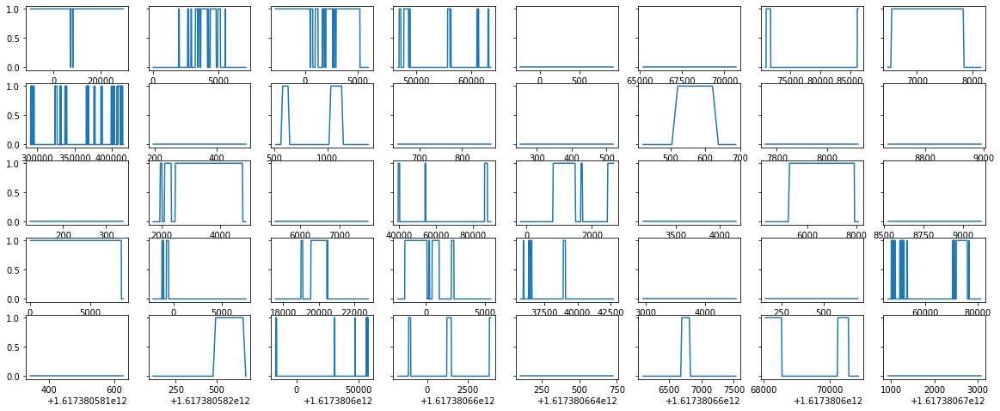

In [22]:
def plot_vid_sess(vid_sess, startind=0):
    fig, ax = plt.subplots(nrows=5, ncols=8, sharey=True, figsize=(20,8))
    ax = ax.flatten()
    for p, i in enumerate(range(startind, startind+40)):
        ax[p].plot(vid_sess[i%len(vid_sess)]['timestamp_ms'],vid_sess[i%len(vid_sess)]['AU45_c'])
    plt.show()
    
plot_vid_sess(vid_sess)

#### Save the data

Given our time aligned video data and our chunks of reasonable tracking, we can save some metadata about what chunks we have and how many blinks we detect in each chunk.  This is what we'll use for ground truth.

In [24]:
def count_rising_edges(sess, column):
    #assuming a 1/0 signal, counts transitions to 1.  Starting at 1
    #counts as a transition.
    prev_row, count = 0, 0
    for i,row in sess.iterrows():
        if row[column] == 1 and prev_row == 0: count += 1
        prev_row = row[column]    
    return count

def count_rising_edges_list(values):
    #assuming a 1/0 signal, counts transitions to 1.  Starting at 1
    #counts as a transition.
    prev_row, count = 0, 0
    for v in values:
        if v == 1 and prev_row == 0: count += 1
        prev_row = v    
    return count

def rising_edge_times(sess, column, timecolumn):
    #assuming a 1/0 signal, returns transition times. Starting at 1
    #counts as a transition.
    prev_row, transitions = 0, []
    for i,row in sess.iterrows():
        if row[column] == 1 and prev_row == 0: 
            transitions.append(row[timecolumn])
        prev_row = row[column]    
    return transitions

In [25]:
total, successful = print_summary(df_vid, thresh=0.3)

vid_meta_data = {}
vid_meta_data['total_frames'] = total
vid_meta_data['successful_frames'] = successful
vid_meta_data['percent_successful'] = 100.*successful/total
vid_meta_data['total_duration_sec'] = total/60.
vid_meta_data['session_min_sec'] = MIN_SEC_SESSION
vid_meta_data['session_drop_frames'] = DROP_FRAMES
vid_meta_data['num_sessions'] = len(vid_sess)
vid_meta_data['session_times'] = [[s['timestamp_ms'].iloc[0], s['timestamp_ms'].iloc[-1]] for s in vid_sess]
vid_meta_data['duration_sessions_sec'] = [(s['timestamp_ms'].iloc[-1] - s['timestamp_ms'].iloc[0])/1000. for s in vid_sess]
vid_meta_data['session_total_sec'] = sum(vid_meta_data['duration_sessions_sec'])
vid_meta_data['blinks_per_session'] = [count_rising_edges(s, 'AU45_c') for s in vid_sess]
vid_meta_data['blink_timestamps_per_session'] = [rising_edge_times(s, 'AU45_c', 'timestamp_ms') for s in vid_sess]
vid_meta_data['total_blinks'] = sum(vid_meta_data['blinks_per_session'])
vid_meta_data['blinks_per_sec'] = vid_meta_data['total_blinks'] / vid_meta_data['session_total_sec']

print('Measured', vid_meta_data['total_blinks'], 'blinks.  That gives %.2f blinks/min' % (60.*vid_meta_data['blinks_per_sec']))

pickle.dump(vid_meta_data, open( './cleaned_data/' + SESSION + '/video_blink_sessions.p', "wb" ))

#for k in vid_meta_data: print(k,vid_meta_data[k])

Have 1060310 frames considered successful, (60.42%)
Have 1110519 frames above thresh of 0.3 (63.29%)
Measured 6300 blinks.  That gives 21.55 blinks/min


## Blink Analysis and Comparison

From our 'ground truth' data above, we have taken the chunks that were 'highly confident' from openface and we've calculated a 'trustworthy' blink rate for this participant (num of confident detected blinks / the duration of confident video).  Using this, we know roughly how many blinks we should expect to capture when we tune our algorithm for blink detection.

We'll apply an algorithm for blink detection, and then run the same rising edge capture script to compare it against all of the short sessions we found in vid_meta_data above.

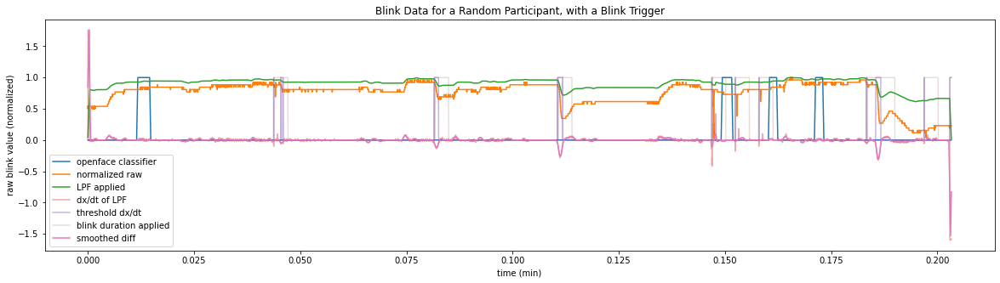

In [26]:
def plot_raw(sess,
             df_vid = None,
             der_avg = 5,
             thresh = .1,
             sess_start_min=2,
             sess_max_dur_min=10,
             blink_dur_ms=300
            ):
    try:
        test_sess = sess.iloc[int(60*1000*sess_start_min):int(60*1000*(sess_start_min+sess_max_dur_min))]
    except:
        test_sess = sess
       
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    
    fig, ax = plt.subplots(figsize=(20,5))
        
    if df_vid is not None:
        df_vid = df_between_timestamps(df_vid, 'timestamp_ms',  test_sess['timestamp_ms'].iloc[0], test_sess['timestamp_ms'].iloc[-1])
        vid_sig = []
        for i, row in df_vid.iterrows():
            if row['success']: vid_sig.append(row['AU45_c'])
            else: vid_sig.append(np.nan)
                
        ax.plot((df_vid['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, vid_sig, label='openface classifier')
        
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, (test_sess['value'] - min(test_sess['value']))/(max(test_sess['value']) - min(test_sess['value'])), label='normalized raw')
        
    smoothed = moving_average(test_sess['value'], der_avg)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, (smoothed- min(smoothed))/(max(smoothed)-min(smoothed)), label='LPF applied')
    first_der = np.append([0], np.diff(smoothed))
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, first_der, label='dx/dt of LPF', alpha=0.4)
    
    decision = (first_der < -1*thresh)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, decision, label='threshold dx/dt', alpha=0.5)
    
    blink = []
    samples_per_blink = int((blink_dur_ms / 1000) * 1000) ## 300 ms / 1000ms/s * fps
    i=0
    while i<len(decision):
        if decision[i]:
            blink.extend([1]*samples_per_blink)
            i += samples_per_blink
        else: 
            blink.append(0)
            i += 1
    if len(blink)>len(decision): blink = blink[:len(decision)]
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, blink, label='blink duration applied', alpha=0.2)
    
    smoothing_diff_samples = 25
    smoothed_diff = moving_average(first_der, smoothing_diff_samples)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, smoothed_diff, label='smoothed diff')
    
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('raw blink value (normalized)')
    ax.set_title('Blink Data for a Random Participant, with a Blink Trigger')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()

    
plot_raw(blink_sess[0],new_df_vid,50,.06,6.1,.2, 200)
#55 is the 'right answer' I think

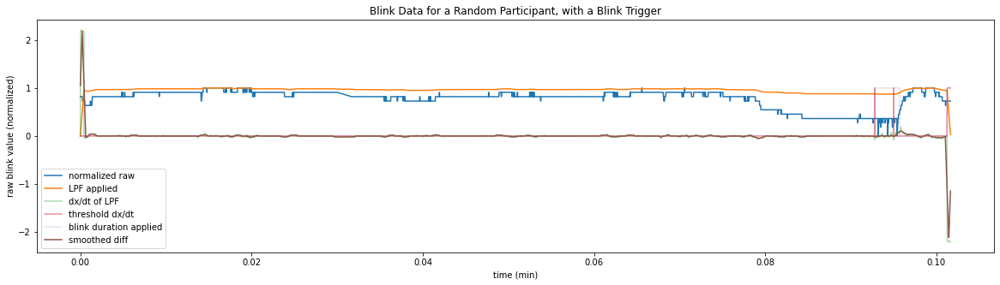

In [27]:
plot_raw(blink_sess[0],None,50,.07,1.1,.1,175)

selected: 15600000 max: 15670500


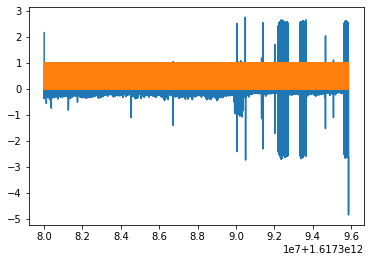

got blinks
   duration_ms  timestamp_ms  vel_close  vel_open
0        -23.0  1.617380e+12     0.3816    0.0104
1        111.0  1.617380e+12     0.1384    0.1456
2        231.0  1.617380e+12     0.1472    0.0664
3        205.0  1.617380e+12     0.1048    0.0664
4        217.0  1.617380e+12     0.1824    0.0552
8375


In [28]:
#this should work well --
# we need 25 samples into the future to do the process for now, so about 25 ms after the blink is complete.
# (1) LPF incoming signal, 25 in past and 25 in future
# (2) Take the difference of that with the previous
# (3) LPF this signal with 12 in past and 12 in future
# (4) check if it's lower than a given threshold.  If so, it's a blink.
# (5) start tracking at that point for the lowest value and the highest value, as well as their timestamps, for the next 175 ms.
# (6) capture lowest and highest derivative values.  Their time difference is a clean value proportional to blink duration.  These two values are blink velocity.
# (7) we now have blink yes/no, velocity close, velocity open, duration.  We require 4/5 pieces of data to run this algorithm -- LPF size for input, LPF size for derivative, threshold, blink_duration, reverse (assumption blink signal is low to high rather than high to low).

#we may not need to use the LPF on the derivative.

#we want to allow for half blink/double blinks, where there may not be a full recovery.  We should only debounce blink_dur/2, though we search for peaks for blink_dur

def grab_blinks(blink_sess, thresh=0.06, blink_dur_ms=175, lpf_samples=50, dx_lpf_samples=25, reverse=False):
    #get array of (1)timestamps of blinks, (2) [peak close velocity, peak open velocity], (3) duration
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    #step 1: LPF input, take derivative, LPF derivative
    smooth_input = moving_average(blink_sess['value'], lpf_samples)
    dx = np.append([np.nan], np.diff(smooth_input))
    smooth_dx = moving_average(dx, dx_lpf_samples)
    df_results = pd.DataFrame({'timestamp_ms':blink_sess['timestamp_ms'], 'dx':smooth_dx})
    
    #step 2, apply threshold
    if reverse:
        decision = (smooth_dx > thresh)
    else:
        decision = (smooth_dx < -1*thresh)

    plt.plot(df_results['timestamp_ms'], df_results['dx'])
    plt.plot(df_results['timestamp_ms'], decision)
    plt.show()
    #step 3, use this thresholded value to decide if we are blinking subject to debounce.
    #grab the blink time. within the bounds of the blink, find the duration and peak velocities using the derivative.
    df_blinks = pd.DataFrame()
    samples_per_blink = int(blink_dur_ms)  # happen to sample at 1kHz so 1 sample == 1 ms
    samples_blink_debounce = int(samples_per_blink/2)
    i, blinkrow = 0, {}
    while i<len(decision):
        if decision[i]: #we have a blink
            blinkrow['timestamp_ms'] = df_results['timestamp_ms'].iloc[i] #timestamp of this blink
            
            df_thisblink = df_results.iloc[i:i+samples_per_blink] #grab the data associated with this blink
            if reverse:
                max_close = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].max()]
                max_open  = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].min()]
            else:
                max_close = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].min()]
                max_open  = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].max()]
            
            blinkrow['vel_close'] = abs(max_close['dx'].iloc[0]) #peak close velocity
            blinkrow['vel_open']  = abs(max_open['dx'].iloc[-1]) #peak open velocity
            blinkrow['duration_ms'] = max_open['timestamp_ms'].iloc[-1] - max_close['timestamp_ms'].iloc[0] #duration
            
            df_blinks = df_blinks.append(blinkrow, ignore_index=True)
            i += samples_blink_debounce #move ahead debounce samples before checking for blinks again
        else: i += 1
            
    return df_blinks

def plot_df_blinks_over_session(df_blinks, blink_sess, df_vid=None, lpf_samples=50):
    fig, ax = plt.subplots(figsize=(24,5))
    
    if df_vid is not None:
        df_v = df_between_timestamps(df_vid, 'timestamp_ms', blink_sess['timestamp_ms'].iloc[0], blink_sess['timestamp_ms'].iloc[-1])
        df_v.loc[df_v['success'] == 0, 'AU45_r'] = np.nan
        df_v.loc[df_v['success'] == 0, 'AU45_c'] = np.nan

        ax.plot((df_v['timestamp_ms'] - df_v['timestamp_ms'].iloc[0])/60000, (df_v['AU45_r']/5.0), label='vid continuous')
        ax.plot((df_v['timestamp_ms'] - df_v['timestamp_ms'].iloc[0])/60000, (df_v['AU45_c']), label='vid binary')
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
        
    smooth_sess = moving_average(blink_sess['value'], lpf_samples)
    ax.plot((blink_sess['timestamp_ms'] - blink_sess['timestamp_ms'].iloc[0])/60000, (smooth_sess - min(smooth_sess))/(max(smooth_sess) - min(smooth_sess)), label='normalized raw')
       
    blink_sess['blink_signal'] = 0
    for i, row in df_blinks.iterrows():
        blink_sess.loc[((int(row['timestamp_ms']) <= blink_sess['timestamp_ms']) & (blink_sess['timestamp_ms'] <= int(row['timestamp_ms'] + row['duration_ms']))), 'blink_signal'] = 1
    
    ax.plot((blink_sess['timestamp_ms'] - blink_sess['timestamp_ms'].iloc[0])/60000, blink_sess['blink_signal'], label='blink signal')
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('raw blink value (normalized)')
    ax.set_title('Blink Data for a Random Participant, with a Blink Trigger')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()
    
#df_blinks = grab_blinks(blink_sess[0].iloc[:10000],blink_dur_ms=250)
#plot_df_blinks_over_session(df_blinks, blink_sess[0].iloc[:10000].copy())

#Grab only a section of blinks
STARTMIN = 0
ENDMIN = 260
sess_i = 0
endsample = 1000*60*ENDMIN
print('selected:', endsample,'max:',len(blink_sess[sess_i]))
df_blinks = grab_blinks(blink_sess[sess_i].iloc[1000*60*STARTMIN:1000*60*ENDMIN], blink_dur_ms=250)
print('got blinks')
print(df_blinks.head())
#plot_df_blinks_over_session(df_blinks, blink_sess[sess_i].iloc[1000*60*STARTMIN:1000*60*ENDMIN].copy(), new_df_vid)
print(len(df_blinks))

In [72]:
8375/260

32.21153846153846

In [29]:
#now look and see how well we line up by comparing just the sections that match
#iterate over glasses section, all video sections within--
# num counted glass, num counted blink -- true positive, real positive, false positive

#1 iterate over video sections
#2 find the relevant glasses section
#3 compare times and add to hit rates with some threshold

def get_all_blink_sessions(blink_sessions, thresh=0.06, blink_dur_ms=250, lpf_samples=50, dx_lpf_samples=25, reverse=False):
    
    df_result = pd.DataFrame()
    for sess in blink_sessions:
        df_blinks = grab_blinks(sess,
                                thresh=thresh, 
                                blink_dur_ms=blink_dur_ms, 
                                lpf_samples=lpf_samples, 
                                dx_lpf_samples=dx_lpf_samples, 
                                reverse=reverse)
        df_result = df_result.append(df_blinks, ignore_index=True)
        
    return df_result

def get_stats_glasses_vs_video(vid_meta_data, df_blinks, tolerance_ms=250):
    results = {'true_pos':0, 'false_pos':0, 'real_pos':0}
    #real pos should equal vid_meta_data['total_blinks'] by the end
    
    for i in range(vid_meta_data['num_sessions']):
        glasses_blink_in_sess = df_between_timestamps(df_blinks, 'timestamp_ms', vid_meta_data['session_times'][i][0]-tolerance_ms, vid_meta_data['session_times'][i][1]+tolerance_ms)
        g_blink_times = glasses_blink_in_sess['timestamp_ms'].tolist()
        v_blink_times = vid_meta_data['blink_timestamps_per_session'][i]
        print('-'*20)
        print(g_blink_times)
        print(v_blink_times)
        
        results['real_pos'] += len(v_blink_times)
        for  vtime in v_blink_times:
            for gtime in g_blink_times:
                if vtime-tolerance_ms <= gtime <= vtime+tolerance_ms:
                    #print('hit!',vtime,':',gtime)
                    results['true_pos'] += 1
                    g_blink_times.remove(gtime)
                    break
        g_blink_times = [t for t in g_blink_times if vid_meta_data['session_times'][i][0] < t <= vid_meta_data['session_times'][i][1]]
        results['false_pos'] += len(g_blink_times)
        #print(results)

    results['sensitivity'] = results['true_pos'] / results['real_pos'] * 100
    results['false_discovery'] = results['false_pos'] / (results['false_pos'] + results['true_pos']) * 100
    
    return results
    
# sensitivity/hit rate = true positive / real positives
# false discovery rate = false positive / (false positive + true positive)

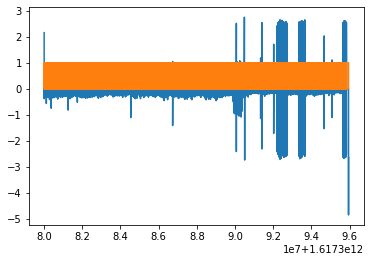

--------------------
[1617380194759.0, 1617380195004.0, 1617380196809.0, 1617380197479.0, 1617380198324.0, 1617380199072.0, 1617380199754.0, 1617380204468.0, 1617380207488.0, 1617380208142.0, 1617380208611.0, 1617380208927.0, 1617380210151.0, 1617380210517.0, 1617380210895.0, 1617380211442.0, 1617380212454.0, 1617380213597.0, 1617380213879.0, 1617380214535.0, 1617380214968.0, 1617380216055.0, 1617380216648.0, 1617380220132.0, 1617380220619.0, 1617380220999.0, 1617380221746.0, 1617380223486.0, 1617380224460.0, 1617380225062.0, 1617380226414.0, 1617380229564.0]
[1617380190000.0, 1617380207167.0, 1617380208268.0]
--------------------
[1617380230207.0, 1617380231500.0, 1617380234772.0, 1617380235155.0, 1617380236435.0, 1617380236781.0]
[1617380231975.0, 1617380232660.0, 1617380232910.0, 1617380233243.0, 1617380233460.0, 1617380233661.0, 1617380234211.0, 1617380234378.0, 1617380234945.0, 1617380235512.0]
--------------------
[1617380238314.0, 1617380238929.0, 1617380239700.0, 1617380240821.

In [30]:
#get all blinks from all glasses blink sessions in one df
df_all_glasses_blinks = get_all_blink_sessions(blink_sess)

#compare
results = get_stats_glasses_vs_video(vid_meta_data, df_all_glasses_blinks)
print(results)

print('saving to file ./cleaned_data/' + SESSION + '/blink_results.p')
pickle.dump(results, open( './cleaned_data/' + SESSION + '/blink_results.p', "wb" ))
    

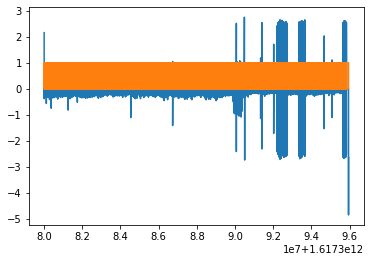

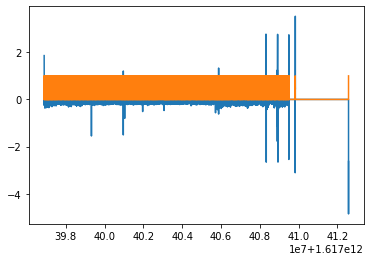

--------------------
[1617380236781.0, 1617380238314.0, 1617380238929.0, 1617380239700.0, 1617380240821.0, 1617380241907.0, 1617380242826.0, 1617380243798.0, 1617380244196.0, 1617380246024.0, 1617380257641.0, 1617380258693.0, 1617380266317.0, 1617380268163.0, 1617380272755.0, 1617380275059.0, 1617380276880.0]
[1617380236852.0, 1617380254019.0, 1617380255120.0]
{'true_pos': 1, 'false_pos': 15, 'real_pos': 3, 'sensitivity': 33.33333333333333, 'false_discovery': 93.75}


In [30]:
#WEIRD BASTARDIZATION OF FUNCTION
def get_stats_glasses_vs_video(vid_meta_data, df_blinks, tolerance_ms=250):
    results = {'true_pos':0, 'false_pos':0, 'real_pos':0}
    #real pos should equal vid_meta_data['total_blinks'] by the end
    
    i=0
    glasses_blink_in_sess = df_between_timestamps(df_blinks, 'timestamp_ms', vid_meta_data['session_times'][i][0]-tolerance_ms, vid_meta_data['session_times'][i][1]+tolerance_ms)
    g_blink_times = glasses_blink_in_sess['timestamp_ms'].tolist()
    v_blink_times = vid_meta_data['blink_timestamps_per_session'][i]
    print('-'*20)
    print(g_blink_times)
    print(v_blink_times)

    results['real_pos'] += len(v_blink_times)
    for  vtime in v_blink_times:
        for gtime in g_blink_times:
            if vtime-tolerance_ms <= gtime <= vtime+tolerance_ms:
                #print('hit!',vtime,':',gtime)
                results['true_pos'] += 1
                g_blink_times.remove(gtime)
                break
    g_blink_times = [t for t in g_blink_times if vid_meta_data['session_times'][i][0] < t <= vid_meta_data['session_times'][i][1]]
    results['false_pos'] += len(g_blink_times)
    #print(results)

    results['sensitivity'] = results['true_pos'] / results['real_pos'] * 100
    results['false_discovery'] = results['false_pos'] / (results['false_pos'] + results['true_pos']) * 100
    
    return results

#second try just for beata -- just first video session
df_all_glasses_blinks = get_all_blink_sessions(blink_sess)

#compare
results = get_stats_glasses_vs_video(vid_meta_data, df_all_glasses_blinks)
print(results)    

In [ ]:
#juliana 5%, irmandy 20%, beata 60% video.  All about 20% true positive rate

#same issue for beata

# I think we need to 
#  (1) mine blink times from the video now,
#  (2) consolidate times that are within a blink_dur of each other
#  (3) time align by minimizing the difference with an offset

In [32]:
#we have df_blinks from the glasses 
#we have vid_meta_data['blink_timestamps_per_session'] from the video
flatten = lambda t: [item for sublist in t for item in sublist]

#seems to be fine, need to discount all video blinks not in glasses range, but in from both sides by 2*s_meta['start_error_sec']*1000
#df_blink only has a few blinks in it-- short session?  Need all blinks

max_offset_ms = 2*s_meta['start_error_sec']*1000
blink_dur_ms = 250
error_thresh = 150

#step 1, consolidate vid_meta_data with a debounce
vid_blinks = flatten(vid_meta_data['blink_timestamps_per_session'])

v_blinks = vid_blinks.copy()
indices_to_remove = []
for i in range(1, len(vid_blinks)):
    if vid_blinks[i-1] >= vid_blinks[i] - blink_dur_ms:
        indices_to_remove.append(i)

for index in sorted(indices_to_remove, reverse=True):
    del v_blinks[index]

#now we have lists of timestamps in v_blinks, g_blinks
g_blinks = df_blinks['timestamp_ms'].tolist()

#need g_blink[0] - maxoffset - v_blink[0] ... v_blink[-1] - maxoffset - g_blink[-1]
print('pruning v_blinks for alignment',len(v_blinks))
v_blinks = [v for v in v_blinks if (v >= g_blinks[0]+max_offset_ms) and (v <= g_blinks[-1]-max_offset_ms)]
print(len(v_blinks))

#move through all offsets we can think about, brute force
best_offset, min_error = None, None 
for offset in range(-max_offset_ms, max_offset_ms):
    offset_error = 0
    curr_index = 0
    
    for vtime in v_blinks:
        #print('vtime:',vtime)
        #print('vtime+off:',vtime+offset)
        while g_blinks[curr_index] <= (vtime+offset):
            if curr_index==(len(g_blinks)-1): break
            curr_index+=1
        #print('gtimes',g_blinks[curr_index-1],g_blinks[curr_index])
        #print('diffs', (vtime+offset)-g_blinks[curr_index-1], g_blinks[curr_index]-(vtime+offset))
        if curr_index == 0:
            curr_err = abs((vtime+offset)-g_blinks[0])
        elif curr_index == len(g_blinks)-1:
            curr_err = min(abs((vtime+offset)-g_blinks[curr_index-1]), abs(g_blinks[curr_index]-(vtime+offset)))   
        else:
            curr_err = min((vtime+offset)-g_blinks[curr_index-1], g_blinks[curr_index]-(vtime+offset))
        
        if curr_err < error_thresh: curr_err = 0
        offset_error += curr_err
        #print('curr, accum err:',curr_err, offset_error)
    
    if best_offset is None:
        best_offset = [offset]
        min_error = offset_error
    elif offset_error < min_error:
        #print('new min!')
        best_offset = [offset]
        min_error = offset_error
        #print(min_error, best_offset)
    elif offset_error == min_error:
        print('shared min!')
        best_offset.append(offset)
        print(min_error, best_offset)
print('optimal offset with thresh of 150 ms:')
print(best_offset)


pruning v_blinks for alignment 5176
3890
shared min!
5069944.0 [-118488, -118486]
shared min!
5006172.0 [-117407, -117402]
shared min!
4972787.0 [-117043, -117040]
shared min!
4897134.0 [-99593, -99592]
shared min!
4575814.0 [41134, 41135]
shared min!
4412423.0 [46780, 46782]
shared min!
4376344.0 [47240, 47241]
shared min!
4365288.0 [47316, 47317]
shared min!
4365288.0 [47316, 47317, 47318]
shared min!
4364087.0 [47321, 47322]
shared min!
4345503.0 [47432, 47433]
shared min!
4141135.0 [48435, 48437]
shared min!
4109142.0 [48578, 48583]
shared min!
3911618.0 [49394, 49395]
optimal offset with thresh of 150 ms:
[50217]


[1617380005552.0, 1617380006075.0, 1617380006325.0, 1617380006450.0, 1617380007083.0, 1617380012216.0, 1617380012553.0, 1617380015894.0, 1617380016712.0, 1617380027046.0, 1617380032524.0, 1617380034504.0, 1617380036242.0, 1617380036600.0, 1617380039244.0, 1617380040159.0, 1617380040341.0, 1617380040515.0, 1617380040919.0, 1617380041910.0]
[1617380190000.0, 1617380207167.0, 1617380208268.0, 1617380231975.0, 1617380232660.0, 1617380233243.0, 1617380234211.0, 1617380234945.0, 1617380235512.0, 1617380237181.0, 1617380240517.0, 1617380240968.0, 1617380241635.0, 1617380242636.0, 1617380246840.0, 1617380247708.0, 1617380248759.0, 1617380255733.0, 1617380256300.0, 1617380261105.0]
[-3.07413333 -3.06541667 -3.06125    -3.05916667 -3.04861667 -2.96306667
 -2.95745    -2.90176667 -2.88813333 -2.7159     -2.6246     -2.5916
 -2.56263333 -2.55666667 -2.5126     -2.49735    -2.49431667 -2.49141667
 -2.48468333 -2.46816667]
[0.         0.28611667 0.30446667 0.69958333 0.711      0.72071667
 0.73685  

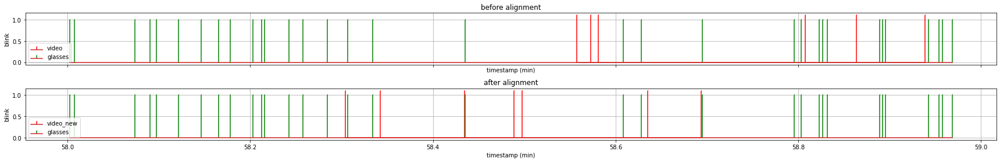

In [126]:
plot_time_start = 58 #min=0
plot_time_end   = 59 #max=262


fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(24,4))
        
#get v_blinks, in min, start_time is g_blinks[0]
v_blink_new = (np.array(v_blinks)-string_to_timestamp_ms(s_meta['vid_start']))/60000
g_blink_new = (np.array(g_blinks)-string_to_timestamp_ms(s_meta['vid_start']))/60000    
best_offset_from_above = 50217

print(g_blinks[:20])
print(v_blinks[:20])

print(g_blink_new[:20])
print(v_blink_new[:20])

print(len(g_blink_new), g_blink_new[0], g_blink_new[-1])
print(len(v_blink_new), v_blink_new[0], v_blink_new[-1])

plot_temp = [v for v in v_blink_new if plot_time_start < v and plot_time_end > v]
markerline, stemlines, baseline = ax[0].stem(plot_temp, [1.1]*len(plot_temp), markerfmt='r,', label='video')
plt.setp(stemlines, 'color', plt.getp(markerline,'color'))
plot_temp = [g for g in g_blink_new if plot_time_start < g and plot_time_end > g]
markerline, stemlines, baseline = ax[0].stem(plot_temp, [1]*len(plot_temp), markerfmt='g,', label='glasses')
plt.setp(stemlines, 'color', plt.getp(markerline,'color'))
ax[0].set(xlabel='timestamp (min)', ylabel='blink', title='before alignment')
ax[0].legend()
ax[0].grid()

v_blink_w_offset = v_blink_new+(best_offset_from_above/60000)
plot_temp = [v for v in v_blink_w_offset if plot_time_start < v and plot_time_end > v]
markerline, stemlines, baseline = ax[1].stem(plot_temp, [1.1]*len(plot_temp), markerfmt='r,', label='video_new')
plt.setp(stemlines, 'color', plt.getp(markerline,'color'))
plot_temp = [g for g in g_blink_new if plot_time_start < g and plot_time_end > g]
markerline, stemlines, baseline = ax[1].stem(plot_temp, [1]*len(plot_temp), markerfmt='g,', label='glasses')
plt.setp(stemlines, 'color', plt.getp(markerline,'color'))
ax[1].set(xlabel='timestamp (min)', ylabel='blink', title='after alignment')
ax[1].legend()
ax[1].grid()

fig.tight_layout()
plt.show()

In [130]:
#show video with overlay of a df with timestamps and an offset so we can manually check blink alignment of both the video DF and our video analysis DF
#above we were aligning the video to the glasses; here we'll align our glasses to the video
import cv2
import imutils

#lets just do everything in minutes like we were doing in the above
def stream_with_blink_data_overlay(video_filename, blinktime_list_ms, video_start_timestamp_ms, start_time_min, end_time_min, fps=60.0):
    
    start_frame = int(start_time_min*60*fps)
    end_frame = int(end_time_min*60*fps)
    
    #blink times to frame list:
    stream_starttime_sec = video_start_timestamp_ms/1000. + start_frame/fps
    blink_duration_sec = 0.5 # how long to show it on screen; make sure if it's a new blink we put a 0 in between
    frame_duration_sec = 1/fps #time between frames in sec
    
    #make array of proper length full of zeros
    blink_sig = np.zeros(end_frame-start_frame)
    
    #whenever we have a blink, put ones in there for blink_dur frames.  Make sure the sample before that blink is zero
    for btime in blinktime_list_ms:
        btime_sec_stream = (btime/1000.)-stream_starttime_sec
        if 0 < btime_sec_stream < (end_time_min-start_time_min)*60:
            bframe = int(btime_sec_stream*fps)
            print((btime/1000), bframe)
            try:
                blink_sig[bframe-1] = 0
            except:
                print('prob first frame')

            blink_sig[bframe:bframe+int(blink_duration_sec*fps)] = 1
    
    WINDOW_NAME = 'blink_window'
    cv2.namedWindow(WINDOW_NAME, cv2.WINDOW_AUTOSIZE)
    cv2.startWindowThread()
    
    #vs = FileVideoStream(video_filename).start()
    vs = cv2.VideoCapture(video_filename)
    vs.set(cv2.CAP_PROP_POS_FRAMES, start_frame-1)
    time.sleep(1.0)
    
    
    prev_frame, blink_count = 0, 0
    for fno in range(0, end_frame-start_frame):
        _, frame = vs.read()  
        #frame = imutils.resize(frame, width=480)
    
        if blink_sig[fno] and not prev_frame:
            blink_count += 1
            
        
        cv2.putText(frame, "COUNT: %d"%(blink_count), (20, 30),
            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
       
        if blink_sig[fno]:
            cv2.putText(frame, "BLINKING NOW!!!!!!", (300, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

        # show the frame
        cv2.imshow(WINDOW_NAME, frame)
        key = cv2.waitKey(1) & 0xFF

        prev_frame = blink_sig[fno]
        
        # if the `q` key was pressed, break from the loop
        if key == ord("q"):
            break

    # do a bit of cleanup
    cv2.waitKey(1)
    cv2.destroyAllWindows()
    cv2.waitKey(1)



In [131]:
stream_with_blink_data_overlay('/Volumes/ExtDrive_(ResEnv)/data_cap_val_2/' + SESSION + '/openface/video_adobe.mp4', 
                               v_blinks, 
                               string_to_timestamp_ms(s_meta['vid_start']), 58.5, 59)

1617383703.462 207
1617383704.347 260
1617383704.847 290
1617383718.444 1106
1617383721.814 1308
1617383726.335 1580


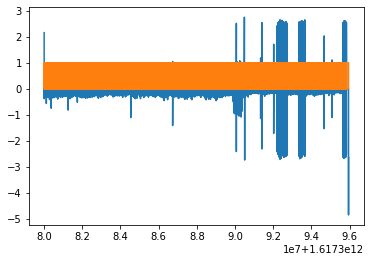

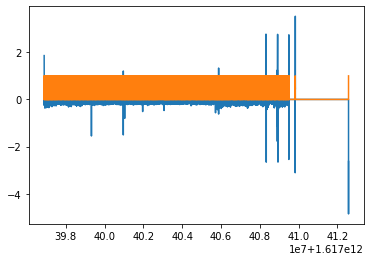

--------------------
[1617380236781.0, 1617380238314.0, 1617380238929.0, 1617380239700.0, 1617380240821.0, 1617380241907.0, 1617380242826.0, 1617380243798.0, 1617380244196.0, 1617380246024.0, 1617380257641.0, 1617380258693.0, 1617380266317.0, 1617380268163.0, 1617380272755.0, 1617380275059.0, 1617380276880.0]
[1617380236852.0, 1617380254019.0, 1617380255120.0]
{'true_pos': 1, 'false_pos': 15, 'real_pos': 3, 'sensitivity': 33.33333333333333, 'false_discovery': 93.75}


In [74]:
def get_stats_glasses_vs_video_altered_time(vid_meta_data, df_blinks, tolerance_ms=250, newtimeoffset=3359):
    results = {'true_pos':0, 'false_pos':0, 'real_pos':0}
    #real pos should equal vid_meta_data['total_blinks'] by the end
    
    for i in range(vid_meta_data['num_sessions']):
        glasses_blink_in_sess = df_between_timestamps(df_blinks, 'timestamp_ms', vid_meta_data['session_times'][i][0]-tolerance_ms+newtimeoffset, vid_meta_data['session_times'][i][1]+tolerance_ms+newtimeoffset)
        g_blink_times = glasses_blink_in_sess['timestamp_ms'].tolist()
        v_blink_times = [v+newtimeoffset for v in vid_meta_data['blink_timestamps_per_session'][i]]
        print('-'*20)
        print(g_blink_times)
        print(v_blink_times)

        results['real_pos'] += len(v_blink_times)
        for  vtime in v_blink_times:
            for gtime in g_blink_times:
                if vtime-tolerance_ms <= gtime <= vtime+tolerance_ms:
                    #print('hit!',vtime,':',gtime)
                    results['true_pos'] += 1
                    g_blink_times.remove(gtime)
                    break
        g_blink_times = [t for t in g_blink_times if vid_meta_data['session_times'][i][0]+newtimeoffset < t <= vid_meta_data['session_times'][i][1]+newtimeoffset]
        results['false_pos'] += len(g_blink_times)
    #print(results)

    results['sensitivity'] = results['true_pos'] / results['real_pos'] * 100
    results['false_discovery'] = results['false_pos'] / (results['false_pos'] + results['true_pos']) * 100
    
    return results

#second try just for beata -- just first video session
df_all_glasses_blinks = get_all_blink_sessions(blink_sess)

#compare
results = get_stats_glasses_vs_video(vid_meta_data, df_all_glasses_blinks)
print(results)    

# Mapping our quaternions to radians in world coordinates at different sample rates

Our part gives us real part plus the imaginary components (all 4), but the magnitude of these we expect to equal 1 (it is not describing a rotation, as is typical for quaternions, but just a 3D orientation).  The same is true of the video quaternions, which don't bother to include the real part since we know it will sum to 1 with the others in magnitude.

The video is at 60Hz, our time aligned data is at 10Hz.  We want to quickly map one to the other to check for quality.

(1) interpolate 60Hz signal to nearest 10Hz.
(2) find a LMS quaternion to mulitply by one of our datasets to give the other
(3) apply it, plot the result, plot the magnitude error at each timestep

In [29]:
#we have accel_sess and vid_sess

def align_accel_into_vid(accel_sess, vid_sess):
    #let's accumulate our 10hz accel data into one df
    df_all_accel = pd.concat(accel_sess)
    
    pd.options.mode.chained_assignment = None  # default='warn'
    
    combined_dfs = []
    #now we'll make an array for each vid session
    for v in vid_sess:
        #grab accel in that vid_sess
        a = df_between_timestamps(df_all_accel, 
                                  'timestamp_ms', 
                                  v['timestamp_ms'].iloc[0], 
                                  v['timestamp_ms'].iloc[-1])
        #now for each a, interpolate v and append
        for i, row in a.iterrows():
            interpolate_time = row['timestamp_ms']
            v['diff'] = v['timestamp_ms'] - interpolate_time
            
            v_prior = v[v['diff'] == v.loc[v['diff']<=0, 'diff'].max()]
            v_after = v[v['diff'] == v.loc[v['diff']>=0, 'diff'].min()]
            
            weight_prior = abs(v_after['diff'].values[0])
            weight_after = abs(v_prior['diff'].values[0])

            if weight_prior == 0:
                weight_prior = 0
                weight_after = 1
            elif weight_after == 0:
                weight_prior = 1
                weight_after = 0
            else:
                total = weight_prior + weight_after
                weight_prior /= total
                weight_after /= total

            a.loc[i, 'vid_Rx'] = weight_prior*v_prior['pose_Rx'].values[0] + \
                          weight_after*v_after['pose_Rx'].values[0]
            a.loc[i, 'vid_Ry'] = weight_prior*v_prior['pose_Ry'].values[0] + \
                          weight_after*v_after['pose_Ry'].values[0]
            a.loc[i, 'vid_Rz'] = weight_prior*v_prior['pose_Rz'].values[0] + \
                          weight_after*v_after['pose_Rz'].values[0]

                    
                    
        combined_dfs.append(a)
    
    pd.options.mode.chained_assignment = 'warn'
    
    return combined_dfs
        
quat_dfs = align_accel_into_vid(accel_sess, vid_sess)

A simple test to map the glasses frame to the video frame, just using the first timestamp data:

In [209]:
from scipy.spatial.transform import Rotation as R

def test_transform(quat_dfs):
    df_flat = pd.concat(quat_dfs)
    
    rot_vid = R.from_rotvec([df_flat.iloc[0][['vid_Rx', 'vid_Ry', 'vid_Rz']].tolist()])
    rot_glass = R.from_quat([df_flat.iloc[0][['quatReal', 'quatI', 'quatJ', 'quatK']].tolist()])
    
    # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
    x = rot_glass.inv() * rot_vid
    
    print('          glass:', rot_glass.as_euler('xyz', degrees=True))
    print('      transform:', x.as_euler('xyz', degrees=True))
    print('                --------')
    print('glass*transform:', (rot_glass*x).as_euler('xyz', degrees=True))
    print('          video:', rot_vid.as_euler('xyz', degrees=True))

def test_transform_array(quat_dfs):
    df_flat = pd.concat(quat_dfs)
    
    rot_vid = R.from_rotvec(df_flat.iloc[0:10][['vid_Rx', 'vid_Ry', 'vid_Rz']])
    rot_glass = R.from_quat(df_flat.iloc[0:10][['quatReal', 'quatI', 'quatJ', 'quatK']])
    
    # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
    x = (rot_glass.inv() * rot_vid).mean()
    
    for i in range(10):
        print('--')
        print('glass*transform:', (rot_glass[i]*x).as_euler('xyz', degrees=True))
        print('            vid:', rot_vid[i].as_euler('xyz', degrees=True))
    
    
    
test_transform(quat_dfs)
test_transform_array(quat_dfs)

          glass: [[-52.2731154   63.76340843  16.31971017]]
      transform: [[ 42.67021066 -13.529791   -45.84274103]]
                --------
glass*transform: [[-25.7704481   17.47813981   1.63654052]]
          video: [[-25.7704481   17.47813981   1.63654052]]
--
glass*transform: [-30.32460936   5.21185673  -2.05193304]
            vid: [-25.7704481   17.47813981   1.63654052]
--
glass*transform: [-28.30601726   5.79076001  -2.43185334]
            vid: [-28.26165767  17.55637846   3.48473688]
--
glass*transform: [-28.40948592   6.60131174  -4.43987973]
            vid: [-27.43175798  15.1233787    3.10243904]
--
glass*transform: [-27.80531076   8.86925067 -10.14167024]
            vid: [-26.33132632  14.40931663   1.75284184]
--
glass*transform: [-28.2435792    9.44685792 -12.09179295]
            vid: [-27.04173537  15.40480903   1.67677675]
--
glass*transform: [-27.80956036   9.10468302 -11.79521296]
            vid: [-25.03515073  14.34669021   1.30133591]
--
glass*transform: [

Now we try to do it in a LMS way over all glasses rotations and video rotations

In [28]:
def apply_transform(quat_df_array, by_session=True, technique='avg'):
    
    if not by_session:
        df_flatten = pd.concat(quat_df_array)
        rot_vid   = R.from_rotvec(df_flatten[['vid_Rx', 'vid_Ry', 'vid_Rz']])
        rot_glass = R.from_quat(df_flatten[['quatReal', 'quatI', 'quatJ', 'quatK']])
        # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
        rot_transforms = (rot_glass.inv() * rot_vid)
        
        #should apply to vector [1,0,0] to see what it looks like when plotting rotations
        test_vec = [[1,0,0]]*len(rot_transforms)        
        fig = plt.figure(figsize=(8,8))
        ax = plt.axes(projection='3d')
        data = rot_transforms.apply(test_vec)
        print(data.shape)
        ax.scatter3D(data[:,0], data[:,1], data[:,2], alpha=.2)
        
        Transform_1 = rot_transforms.mean()
        t1 = Transform_1.apply(test_vec[0])
        ax.plot3D([0,t1[0]], [0,t1[1]], [0,t1[2]], linewidth=3, label = 'transform 1', color='green')
        
        Transform_2 = R.align_vectors(rot_vid.apply(test_vec), rot_glass.apply(test_vec))
        t2 = Transform_2[0].apply(test_vec[0])
        ax.plot3D([0,t2[0]], [0,t2[1]], [0,t2[2]], linewidth=3, label = 'transform 2', color='red')
        plt.show()
        
        if technique=='avg': Transform = Transform_1
        else: Transform = Transform_2[0]
        
    for i in range(len(quat_df_array)):
        
        try:
            if by_session:
                rot_vid   = R.from_rotvec(quat_df_array[i][['vid_Rx', 'vid_Ry', 'vid_Rz']])
                rot_glass = R.from_quat(quat_df_array[i][['quatReal', 'quatI', 'quatJ', 'quatK']])
                # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
                if technique=='avg':
                    Transform = (rot_glass.inv() * rot_vid).mean()
                else:
                    test_vec = [[1,0,0]]*len(rot_vid)
                    Transform = R.align_vectors(rot_vid.apply(test_vec), rot_glass.apply(test_vec))[0]
        
            def apply_quat(row):
                return (R.from_quat(row[['quatReal', 'quatI','quatJ', 'quatK']].tolist())*Transform).as_euler('xyz').tolist()

            quat_results = pd.DataFrame(quat_df_array[i].apply(apply_quat, axis=1).to_list(), columns = ['glasses_Rx', 'glasses_Ry', 'glasses_Rz'])

            quat_df_array[i].reset_index(drop=True, inplace=True)
            quat_df_array[i] = pd.concat([quat_df_array[i], quat_results], axis=1)
        except:
            print('failed for #',i,'in quat_array. Len samples:', len(quat_df_array[i]))
    return quat_df_array


temp_quat_dfs = quat_dfs.copy()
new_quat_dfs = apply_transform(temp_quat_dfs, by_session=False)

NameError: name 'quat_dfs' is not defined

In [211]:
new_quat_dfs[0].head()

,timestamp_ms,quatI,quatJ,quatK,quatReal,quatRadianAccuracy,vid_Rx,vid_Ry,vid_Rz,glasses_Rx,glasses_Ry,glasses_Rz
0,1617978215926,-0.416260,-0.338501,-0.721558,0.437561,1.773438,-0.450588,0.293529,0.096471,0.659296,0.124626,-1.607706
1,1617978216026,-0.415527,-0.344116,-0.729065,0.421143,1.773682,-0.498529,0.285294,0.134706,0.648967,0.159660,-1.619178
2,1617978216126,-0.428162,-0.334167,-0.731812,0.411743,1.773682,-0.483000,0.246000,0.116000,0.634653,0.157766,-1.656292
3,1617978216227,-0.459595,-0.307861,-0.742615,0.377563,1.773926,-0.460938,0.240062,0.087687,0.594416,0.167742,-1.763747
4,1617978216326,-0.470764,-0.296509,-0.743896,0.370239,1.774170,-0.473000,0.257000,0.092000,0.584323,0.160028,-1.798213


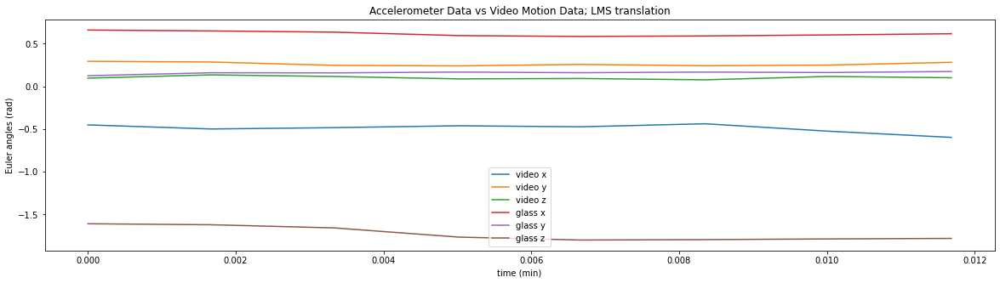

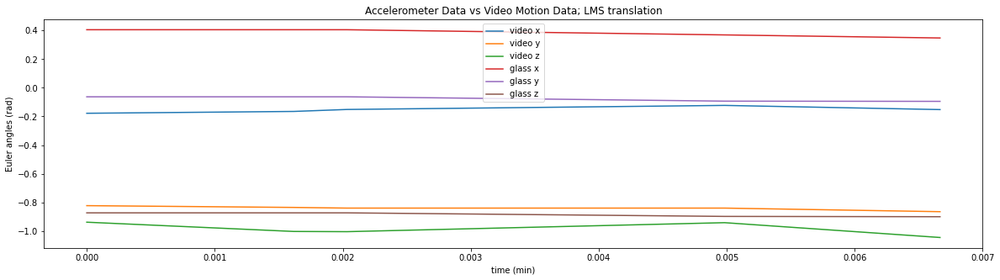

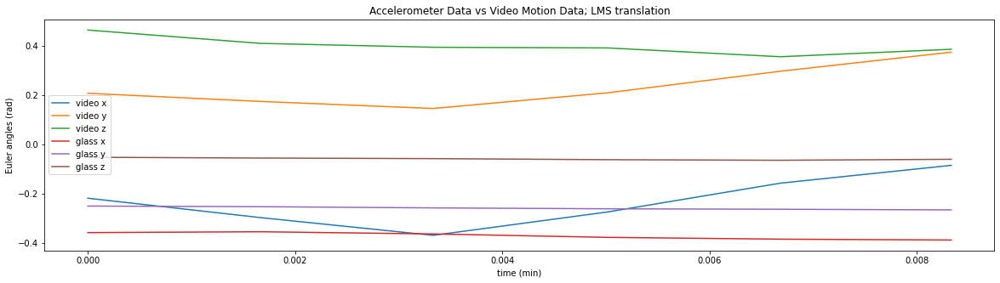

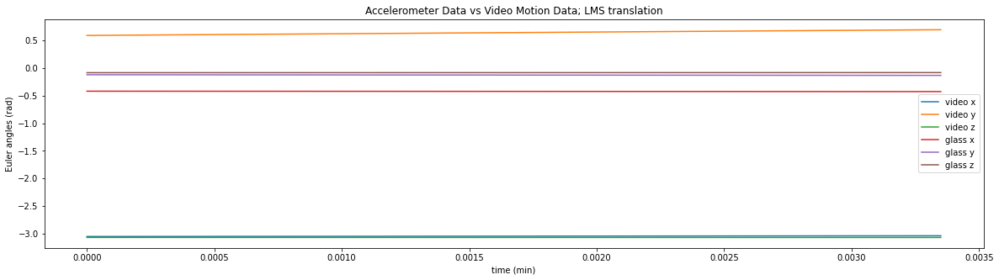

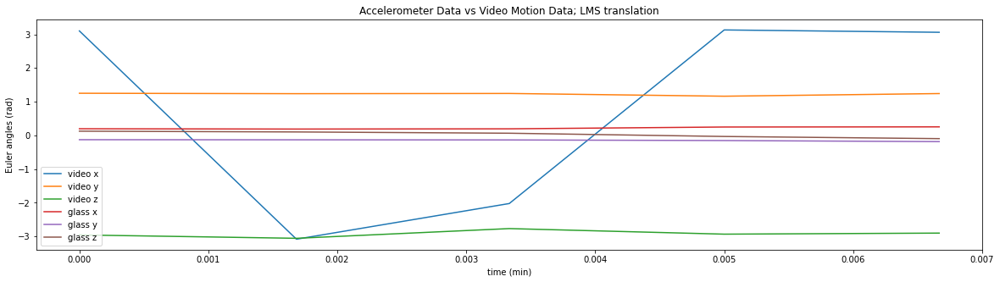

...

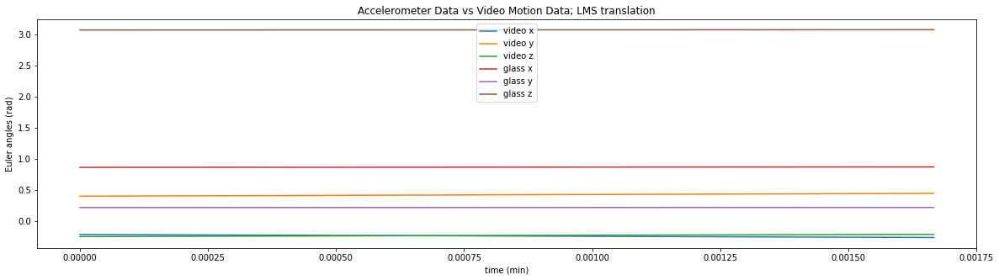

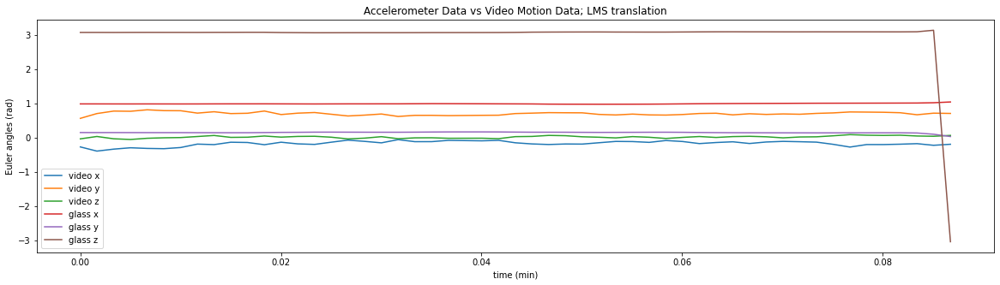

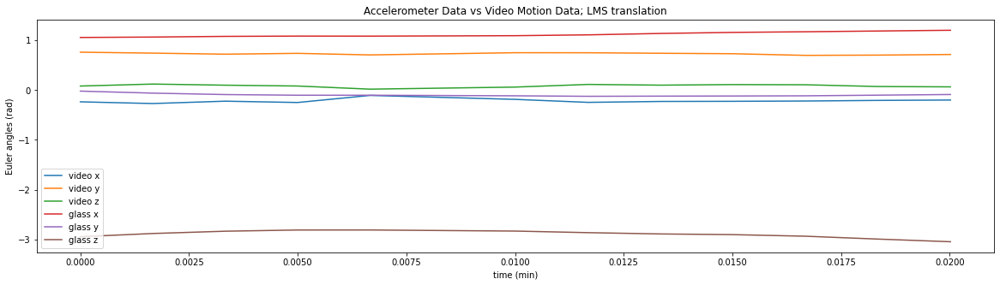

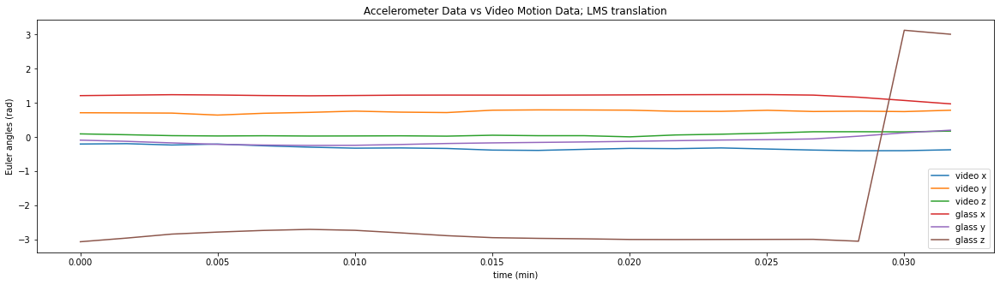

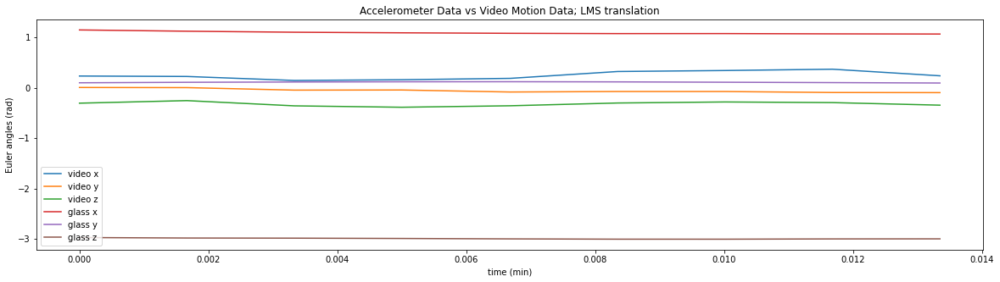

IndexError: single positional indexer is out-of-bounds

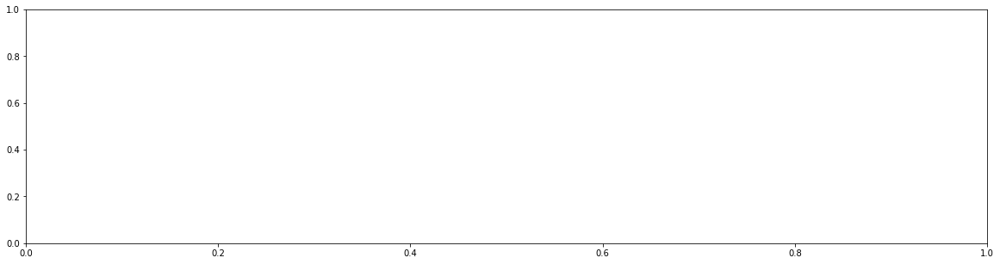

In [212]:
for sess in new_quat_dfs:
    fig, ax = plt.subplots(figsize=(20,5))
      
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Rx'], label='video x')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Ry'], label='video y')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Rz'], label='video z')
    
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Rx'], label='glass x')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Ry'], label='glass y')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Rz'], label='glass z')
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('Euler angles (rad)')
    ax.set_title('Accelerometer Data vs Video Motion Data; LMS translation')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()

In [ ]:
#IMU direct, rot_tick is tick that IMU triggers interrupt and grabs, within ms

# (1) blink align based off of raw timestamps minimize
# (2) IMU rot_tick timestamp
# (3) write a function that play the video snippet working on
# (4) check time alignment between blink binary vs continuous
